In [1]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import Word2Vec
from sklearn.metrics.pairwise import cosine_similarity
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sns
import eli5

In [2]:
data = pd.read_csv('../data/text_dataset_labeled.csv')
data = data.dropna(subset=['text'])

In [3]:
data.head()

,text,location,interest
0,attempt hari tu act like smart deep tech entre...,Unknown,Technology
1,mosti cradle ni clueless whats going tech tal...,Unknown,Technology
2,hightech export country 942b hong kong 431b g...,Unknown,Technology
3,tbh many tech talent dont actually need focus...,Unknown,Technology
4,make 180000 tech consultant london grew extrem...,Unknown,Technology


In [4]:
unique_interests = data['interest'].unique()
print(unique_interests)

['Technology' 'Politics' 'Entertainment' 'FoodnDrink' 'Sports' 'Education']


In [5]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
data['interest_encoded'] = label_encoder.fit_transform(data['interest'])
print(data['interest_encoded'].unique())

[5 3 1 2 4 0]


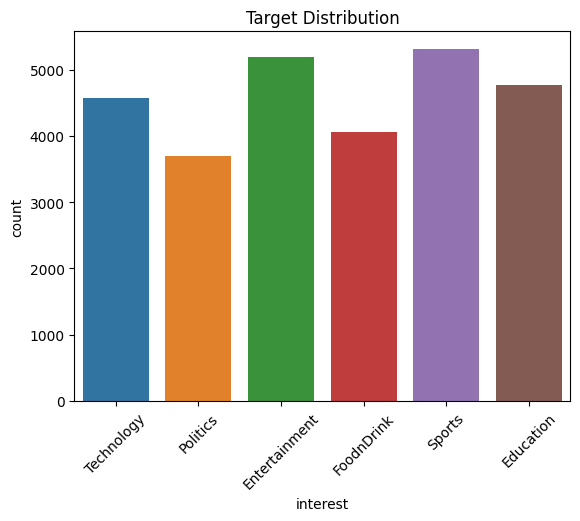

In [6]:
sns.countplot(data=data, x='interest')
plt.title('Target Distribution')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

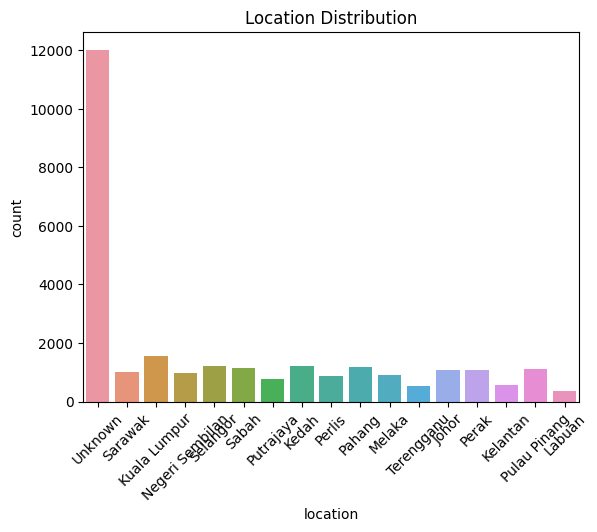

In [7]:
sns.countplot(data=data, x='location')
plt.title('Location Distribution')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

In [8]:
dedu = pd.read_csv('../data/clean/edu_cleaned_data.csv')
dent = pd.read_csv('../data/clean/ent_cleaned_data.csv')
dfoo = pd.read_csv('../data/clean/foo_cleaned_data.csv')
dpol = pd.read_csv('../data/clean/pol_cleaned_data.csv')
dspo = pd.read_csv('../data/clean/spo_cleaned_data.csv')
dtec = pd.read_csv('../data/clean/tec_cleaned_data.csv')

In [9]:
# Concatenate all dataframes into one
combined_data = pd.concat([dedu, dent, dfoo, dpol, dspo, dtec], ignore_index=True)


In [10]:
from wordcloud import WordCloud, STOPWORDS

# Thanks : https://www.kaggle.com/aashita/word-clouds-of-various-shapes ##
def plot_wordcloud(text, mask=None, max_words=200, max_font_size=100, figure_size=(24.0,16.0), 
                   title = None, title_size=40, image_color=False):
    stopwords = set(STOPWORDS)
    more_stopwords = {'one', 'br', 'Po', 'th', 'saying', 'for', 'Unknown'}
    stopwords = stopwords.union(more_stopwords)

    wordcloud = WordCloud(background_color='black',
                    stopwords = stopwords,
                    max_words = max_words,
                    max_font_size = max_font_size, 
                    random_state = 42,
                    width=800, 
                    height=400,
                    mask = mask)
    wordcloud.generate(str(text))
    
    plt.figure(figsize=figure_size)
    if image_color:
        image_colors = ImageColorGenerator(mask);
        plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation="bilinear");
        plt.title(title, fontdict={'size': title_size,  
                                  'verticalalignment': 'bottom'})
    else:
        plt.imshow(wordcloud);
        plt.title(title, fontdict={'size': title_size, 'color': 'black', 
                                  'verticalalignment': 'bottom'})
    plt.axis('off');
    plt.tight_layout()  




def wc_generator(text, title = ''):
    wordcloud_edu = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10,5))
    plt.imshow(wordcloud_edu, interpolation='bilinear')
    plt.axis('off')

    # Add a title to your word cloud
    plt.title("Word Cloud of Malaysian's Post (Twitter - " + title + ")")
    plt.show()


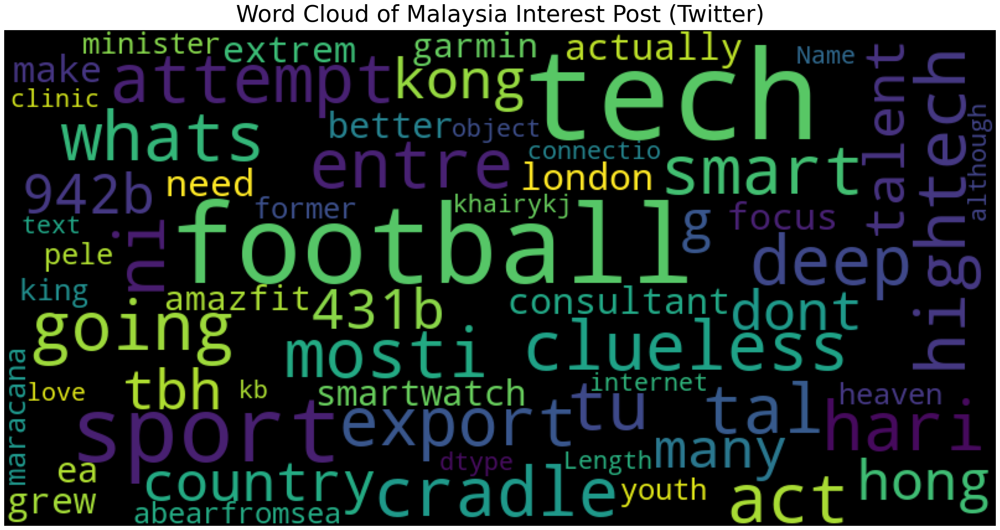

In [11]:
plot_wordcloud(data["text"], title="Word Cloud of Malaysia Interest Post (Twitter)")

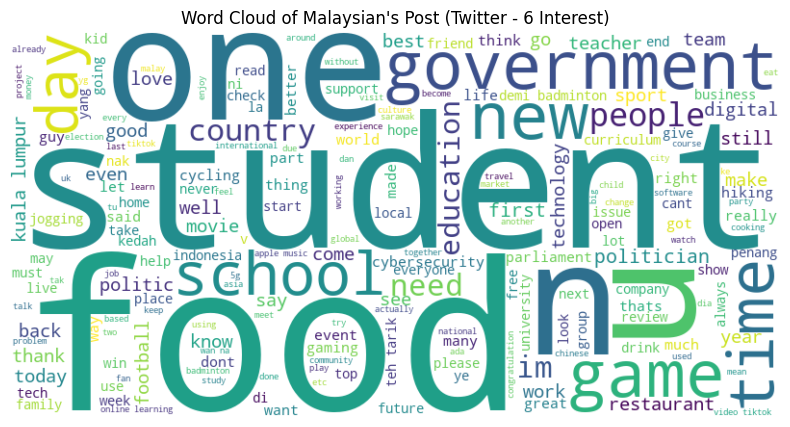

In [12]:
text = ' '.join(data["text"])
wc_generator(text = text, title= '6 Interest')

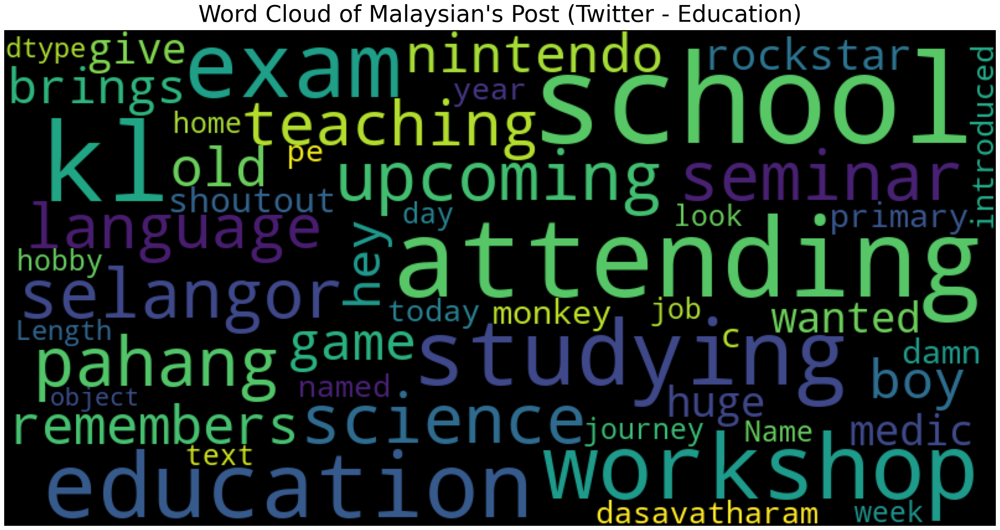

In [13]:

plot_wordcloud(data[data["interest"] == 'Education']["text"], title="Word Cloud of Malaysian's Post (Twitter - Education)")

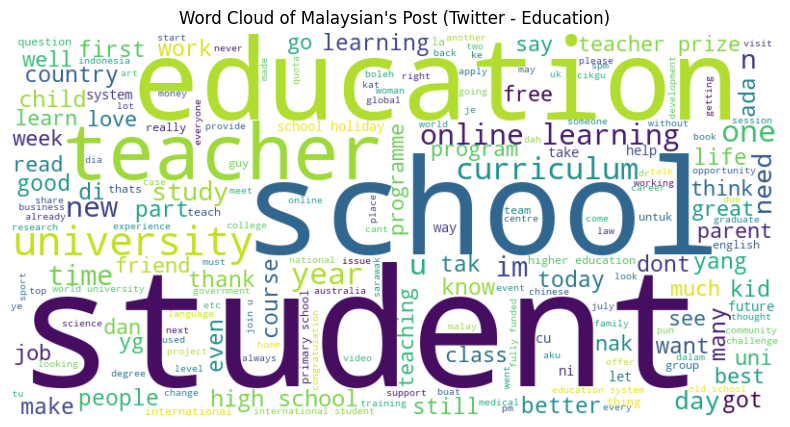

In [14]:
text_edu = ' '.join(data[data["interest"] == 'Education']["text"])
wc_generator(text = text_edu, title= 'Education')

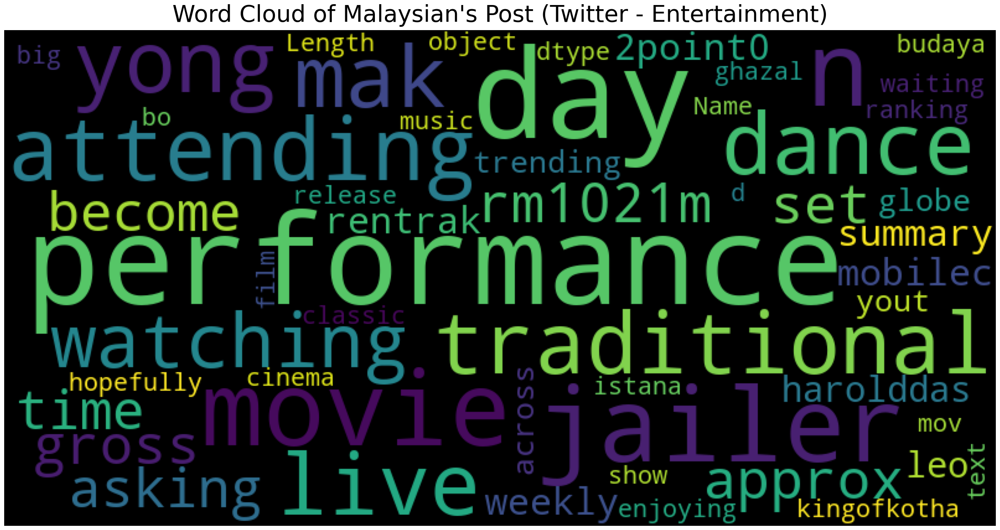

In [15]:
plot_wordcloud(data[data["interest"] == 'Entertainment']["text"], title="Word Cloud of Malaysian's Post (Twitter - Entertainment)")

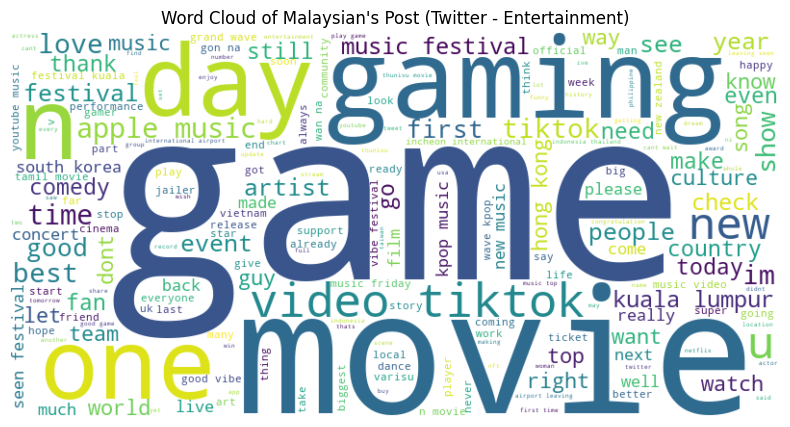

In [16]:
text_ent = ' '.join(data[data["interest"] == 'Entertainment']["text"])
wc_generator(text = text_ent, title= 'Entertainment')

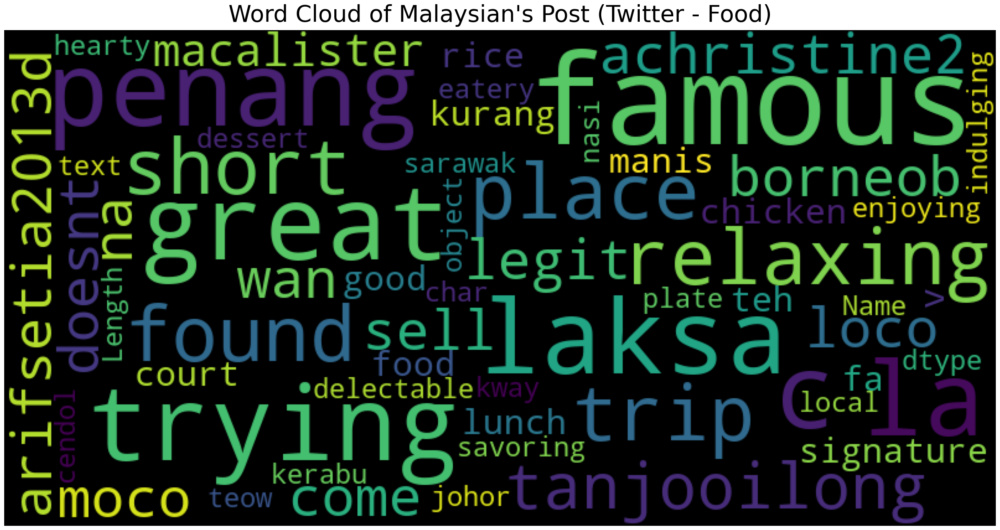

In [17]:

    
plot_wordcloud(data[data["interest"] == 'FoodnDrink']["text"], title="Word Cloud of Malaysian's Post (Twitter - Food)")

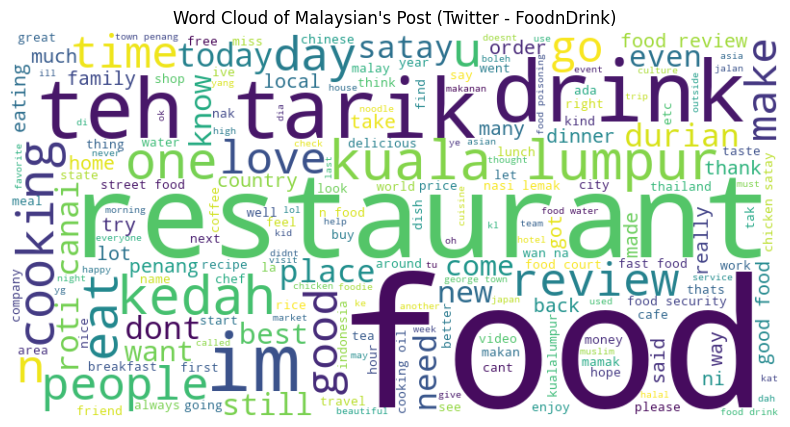

In [18]:
text_foo = ' '.join(data[data["interest"] == 'FoodnDrink']["text"])
wc_generator(text = text_foo, title= 'FoodnDrink')

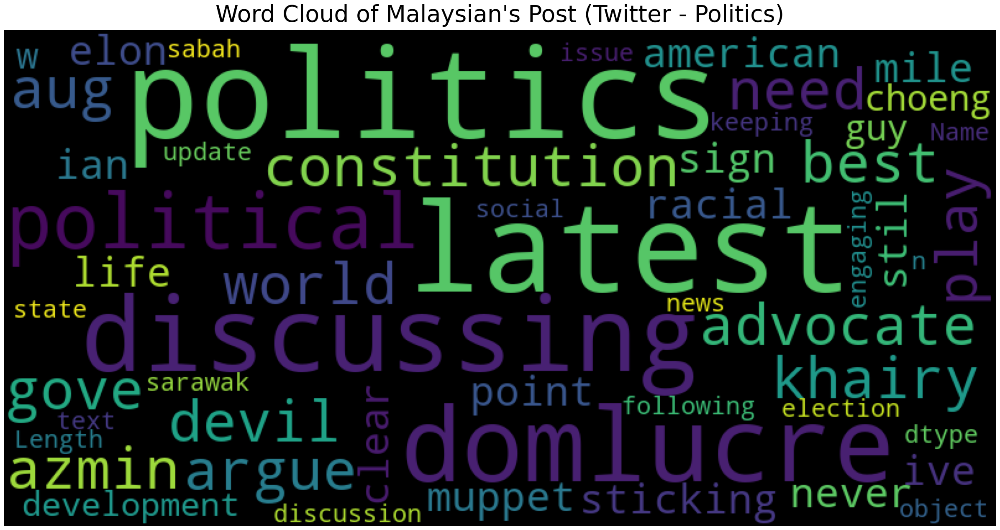

In [19]:

    
plot_wordcloud(data[data["interest"] == 'Politics']["text"], title="Word Cloud of Malaysian's Post (Twitter - Politics)")

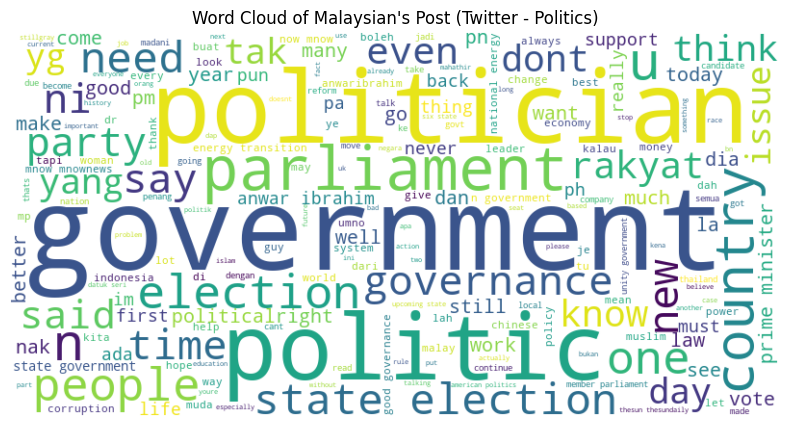

In [20]:
text_pol = ' '.join(data[data["interest"] == 'Politics']["text"])
wc_generator(text = text_pol, title= 'Politics')

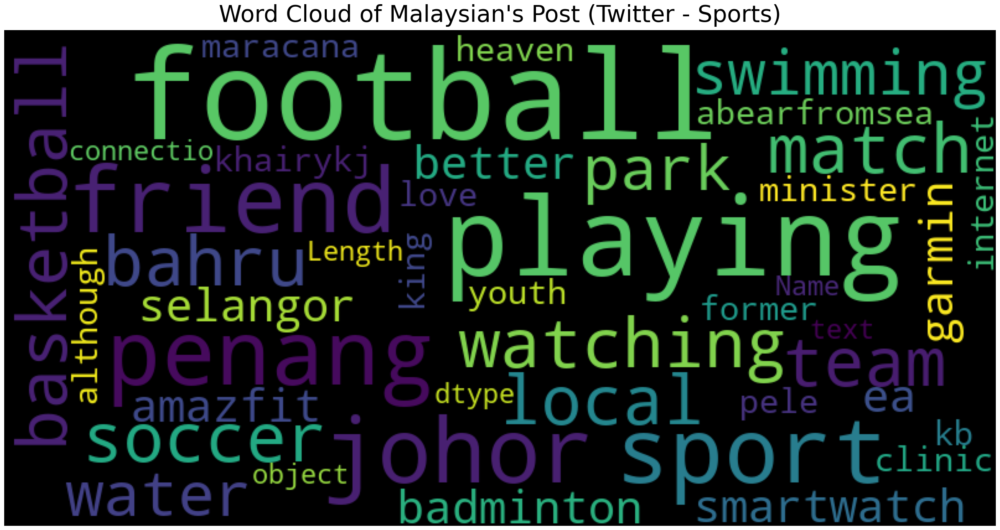

In [21]:

    
plot_wordcloud(data[data["interest"] == 'Sports']["text"], title="Word Cloud of Malaysian's Post (Twitter - Sports)")

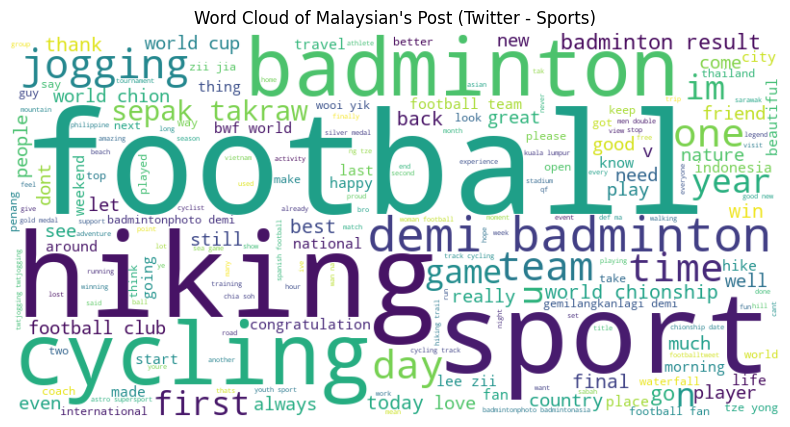

In [22]:
text_spo = ' '.join(data[data["interest"] == 'Sports']["text"])
wc_generator(text = text_spo, title= 'Sports')

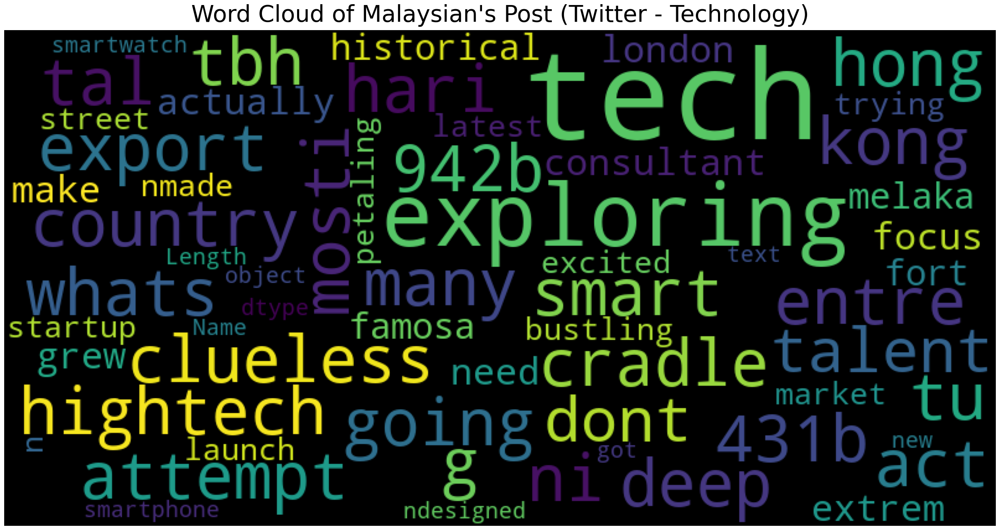

In [23]:

plot_wordcloud(data[data["interest"] == 'Technology']["text"], title="Word Cloud of Malaysian's Post (Twitter - Technology)")

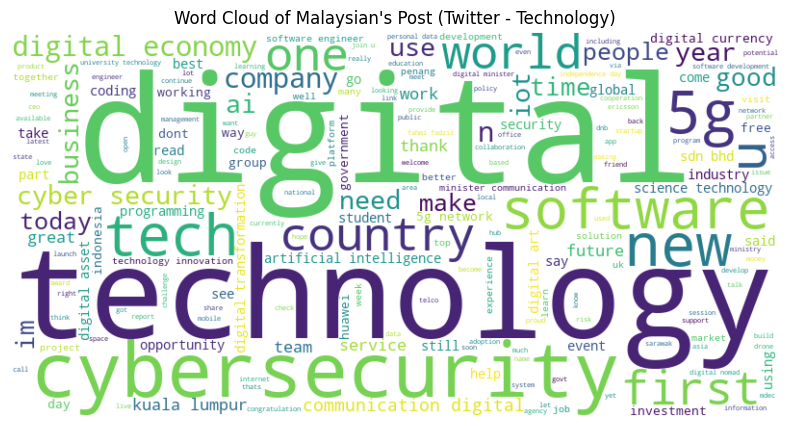

In [24]:
text_tec = ' '.join(data[data["interest"] == 'Technology']["text"])
wc_generator(text = text_tec, title= 'Technology')

-------------------------------------------------------------------------

TF-IDF

In [25]:
# tfidf_vectorizer = TfidfVectorizer(stop_words='english', ngram_range=(1, 2), lowercase=True, max_features=150000)
tfidf_vectorizer = TfidfVectorizer(stop_words='english', lowercase=True, max_features=150000)

In [26]:
# Fit and transform your text data
tfidf_matrix = tfidf_vectorizer.fit_transform(data['text'])

Word2Vec

In [27]:
# Preprocess your text data and tokenize it
tokenized_text = [text.split() for text in data['text']]
# tokenized_text    

In [28]:
word2vec_model = Word2Vec(sentences=tokenized_text, vector_size=100, window=5, min_count=1, sg=0)
word2vec_model.save("word2vec_model")  # Save the model for later use

In [40]:
# Get the vector for a word
word_vector = word2vec_model.wv['education']

# Get the average Word2Vec embeddings for a document
word2vec_embeddings = []
for tokens in tokenized_text:
    document_vector = np.mean([word2vec_model.wv[word] for word in tokens if word in word2vec_model.wv], axis=0)
    word2vec_embeddings.append(document_vector)

In [41]:
word2vec_embeddings

[array([-0.17140691,  0.30561215,  0.69370073, -0.26203534,  0.48930627,
        -1.0287234 ,  0.61127293,  0.69196665,  0.2059889 , -0.5373719 ,
         0.12955311, -1.1233699 , -0.72857994,  0.40968752,  0.0488108 ,
         0.5477317 , -0.17763786, -0.5572129 ,  0.21737553, -0.8199443 ,
         0.28588906,  0.25189525,  0.337499  , -0.1521108 ,  0.22405913,
         0.02802695,  0.00577359,  0.13480155, -0.1825616 , -0.3484283 ,
         0.52346647, -0.3494555 ,  0.05542603, -0.11511739, -0.18375574,
         0.41579276,  0.21771832, -0.01908133,  0.07806008, -0.01471535,
         0.47612712, -0.5364767 , -0.5753256 ,  0.44305298,  0.5183392 ,
         0.3044397 ,  0.0282298 ,  0.18350075,  0.39539433,  0.47768185,
         0.2774339 , -0.4583386 , -0.28712958, -0.01555438, -0.19937412,
         0.33462164,  0.40154633,  0.44683856, -0.31328028,  0.1639646 ,
        -0.4739721 ,  0.07040235, -0.40001646,  0.6433058 , -0.14612572,
         0.6248251 ,  0.51929253,  0.01838402,  0.0

In [30]:


# Create DataFrames for each type of embeddings
tfidf_df = pd.DataFrame(tfidf_matrix, columns=["TF-IDF Embeddings"])
word2vec_df = pd.DataFrame(word2vec_embeddings, columns=["Word2Vec Embeddings_" + str(i) for i in range(100)])



# Concatenate both DataFrames horizontally based on the same index
comparison_df = pd.concat([tfidf_df, word2vec_df], axis=1)

# Display the combined DataFrame
# Import the display function
from IPython.display import display

# Assuming you have created the comparison_df DataFrame
display(comparison_df)

,TF-IDF Embeddings,Word2Vec Embeddings_0,Word2Vec Embeddings_1,Word2Vec Embeddings_2,Word2Vec Embeddings_3,Word2Vec Embeddings_4,Word2Vec Embeddings_5,Word2Vec Embeddings_6,Word2Vec Embeddings_7,Word2Vec Embeddings_8,...,Word2Vec Embeddings_90,Word2Vec Embeddings_91,Word2Vec Embeddings_92,Word2Vec Embeddings_93,Word2Vec Embeddings_94,Word2Vec Embeddings_95,Word2Vec Embeddings_96,Word2Vec Embeddings_97,Word2Vec Embeddings_98,Word2Vec Embeddings_99
0,"(0, 17989)\t0.22168028144471524\n (0, 29104...",-0.171407,0.305612,0.693701,-0.262035,0.489306,-1.028723,0.611273,0.691967,0.205989,...,0.272826,0.298916,0.229080,0.100774,0.366423,0.528287,0.877041,-0.141608,-0.185035,0.061384
1,"(0, 28159)\t0.12871269725223355\n (0, 51413...",-0.130127,0.346119,0.721934,-0.278035,0.490834,-1.018072,0.585345,0.694983,0.206018,...,0.282101,0.266452,0.217564,0.137934,0.358055,0.527458,0.840528,-0.144664,-0.189649,0.121689
2,"(0, 1967)\t0.2101608552315737\n (0, 6875)\t...",0.054170,0.382679,0.495912,-0.278973,0.281501,-0.730200,0.190829,0.507200,0.085529,...,0.465646,0.193379,0.063010,0.286627,0.147281,0.381988,0.412779,-0.212583,-0.147836,0.213216
3,"(0, 43910)\t0.12677311913803382\n (0, 50275...",-0.339510,0.279936,0.838585,-0.232425,0.655808,-1.331424,0.853342,0.881594,0.295706,...,0.340312,0.407779,0.316819,0.035607,0.450866,0.672817,1.204766,-0.124521,-0.248019,-0.015651
4,"(0, 52750)\t0.11008193183178826\n (0, 41469...",-0.106600,0.361196,0.657850,-0.311906,0.488772,-1.023787,0.524734,0.712460,0.207281,...,0.440059,0.281854,0.166169,0.198433,0.301326,0.567856,0.774273,-0.159231,-0.241623,0.141021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27591,"(0, 11629)\t0.4266589695419494\n (0, 4167)\...",-0.190612,0.165877,0.431616,-0.160694,0.304266,-0.718235,0.416873,0.457288,0.139152,...,0.257235,0.223671,0.112581,0.056179,0.197822,0.412759,0.666777,-0.077767,-0.173573,-0.047092
27592,"(0, 29270)\t0.6055831547517772\n (0, 2668)\...",-0.252569,0.143735,0.383449,-0.095800,0.325206,-0.654098,0.455311,0.447128,0.105961,...,0.193988,0.214713,0.139582,0.044326,0.211738,0.374960,0.593610,-0.021310,-0.149113,-0.058214
27593,"(0, 16905)\t0.4245047364213304\n (0, 36538)...",-0.140927,0.329659,0.809769,-0.065178,0.427152,-0.711471,0.405292,0.519402,0.147601,...,0.219290,0.153332,0.144337,0.144847,0.086980,0.485729,0.737620,-0.172604,-0.280368,0.033798
27594,"(0, 17998)\t0.6380768126681334\n (0, 28363)...",-0.809107,0.326718,1.088587,-0.320499,0.985210,-2.012514,1.423061,1.317047,0.331412,...,0.535213,0.718997,0.474617,0.046822,0.717964,1.128536,1.892585,-0.068465,-0.414199,-0.316512


In [39]:
# Compute cosine similarities
tfidf_word2vec_similarities = []

for tfidf_vector, word2vec_vector in zip(tfidf_matrix, word2vec_embeddings):
    similarity = cosine_similarity(tfidf_vector.reshape(1, -1), word2vec_vector.reshape(1, -1))
    tfidf_word2vec_similarities.append(similarity[0][0])

ValueError: Incompatible dimension for X and Y matrices: X.shape[1] == 53379 while Y.shape[1] == 100

In [33]:
X = data['text']
y = data['interest']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

NameError: name 'train_test_split' is not defined

In [34]:
%%time
X_train_text = text_transformer.fit_transform(X_train)
X_test_text = text_transformer.transform(X_test)

NameError: name 'text_transformer' is not defined

In [ ]:
X_train_text.shape, X_test_text.shape

((22076, 150000), (5520, 150000))

Logit

In [ ]:
logit = LogisticRegression(C=5e1, solver='lbfgs', multi_class='multinomial', random_state=17, n_jobs=4)

cross-validation

In [ ]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=17)

In [ ]:
%%time
cv_results = cross_val_score(logit, X_train_text, y_train, cv=skf, scoring='f1_micro')

CPU times: total: 250 ms
Wall time: 1min 39s


In [ ]:
cv_results, cv_results.mean()

(array([0.96490036, 0.9580974 , 0.95719139, 0.9601359 , 0.95266138]),
 0.9585972865068033)

In [ ]:
%%time

logit.fit(X_train_text, y_train)

CPU times: total: 15.6 ms
Wall time: 18.3 s


LogisticRegression(C=50.0, multi_class='multinomial', n_jobs=4, random_state=17)

In [ ]:
# eli5.show_weights(estimator=logit, 
#                   feature_names= list(text_transformer.get_feature_names()),
#                  top=(50, 5))

In [ ]:
eli5.show_weights(estimator=logit, 
                  feature_names=list(text_transformer.get_feature_names_out()),
                  top=(50, 5))

Preparing submission

In [ ]:
test_preds = logit.predict(X_test_text)

In [ ]:
pd.DataFrame(test_preds, columns=['interest']).head()

,interest
0,Education
1,Education
2,Sports
3,Education
4,FoodnDrink


In [ ]:
# pd.DataFrame(test_preds, columns=['interest']).to_csv('../data/logit_tf_idf_starter_submission.csv',
#                                                   index_label='id')

SVM

In [ ]:
from sklearn.svm import SVC
# Initialize an SVM classifier (you can tune hyperparameters)
svm_classifier = SVC(kernel='linear', C=1.0)

# C=5e1, solver='lbfgs', multi_class='multinomial', random_state=17, n_jobs=4

In [ ]:
%%time
# Train the SVM classifier on the training data
svm_classifier.fit(X_train_text, y_train)

CPU times: total: 1min 9s
Wall time: 1min 31s


SVC(kernel='linear')

In [ ]:
from sklearn.multiclass import OneVsRestClassifier
# Use the OneVsRestClassifier to train multiple binary classifiers
ovr_classifier = OneVsRestClassifier(svm_classifier)
ovr_classifier.fit(X_train_text, y_train)

In [ ]:
for idx, estimator in enumerate(ovr_classifier.estimators_):
    print(f"Class {idx}:")
    eli5.show_weights(estimator=estimator, 
                      feature_names=list(text_transformer.get_feature_names_out()),
                      top=(50, 5))

In [ ]:
eli5.show_weights(estimator=svm_classifier, 
                  feature_names=list(text_transformer.get_feature_names_out()),
                  top=(50, 5))

In [ ]:
# test_preds = logit.predict(X_test_text)

# Make predictions on the testing data
y_pred = svm_classifier.predict(X_test_text)